In [8]:
import numpy as np
from PIL import Image, ImageOps
from matplotlib import pyplot as plt
from google.colab import files
import cv2

In [63]:
files.upload()

Saving thinkpad.jpg to thinkpad.jpg


{'thinkpad.jpg': b'\xff\xd8\xff\xe1\r\x97Exif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x0c\x01\x00\x00\x03\x00\x00\x00\x01\x0f\xa0\x00\x00\x01\x10\x00\x02\x00\x00\x00\x08\x00\x00\x00\x9e\x01\x01\x00\x03\x00\x00\x00\x01\x0b\xb8\x00\x00\x01\x12\x00\x03\x00\x00\x00\x01\x00\x06\x00\x00\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00\xa6\x02\x13\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\xd1\x01(\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x88%\x00\x04\x00\x00\x00\x01\x00\x00\r\x89\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\x00\xba\x01\x1b\x00\x05\x00\x00\x00\x01\x00\x00\x00\xc2\x01\x0f\x00\x02\x00\x00\x00\x07\x00\x00\x00\xca\x00\x00\x00\x00MI 9 SE\x002022:05:01 13:54:12\x00\x00\x00\x00H\x00\x00\x00\x01\x00\x00\x00H\x00\x00\x00\x01Xiaomi\x00\x00#\x9a\xaa\x00\x01\x00\x00\n\x00\x00\x00\x02{\x88\'\x00\x03\x00\x00\x00\x01\r[\x00\x00\x88"\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x82\x9d\x00\x05\x00\x00\x00\x01\x00\x00\x0c{\x82\x9a\x00\x05\x00\x00\x00\x01\x00\x00\x0c\x83\x99\x99\

In [64]:
def show_img(img):
    dpi = 320
    width, height = img.shape
    figsize = width / float(dpi), height / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    ax.imshow(img, cmap='gray')
    plt.show()

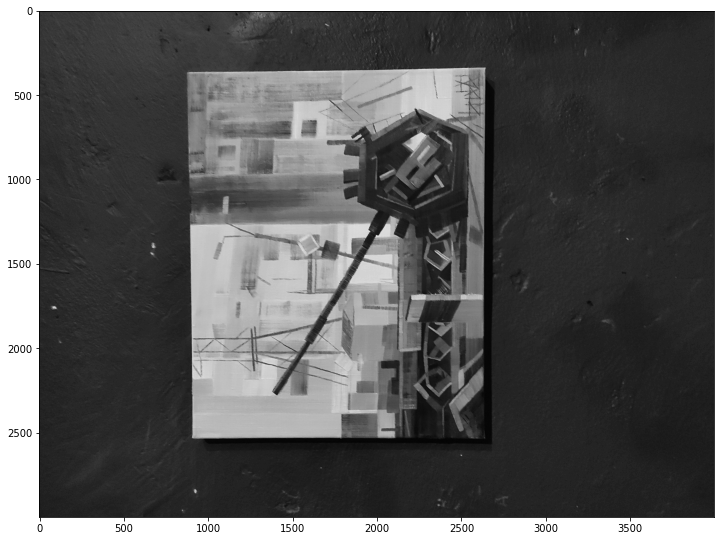

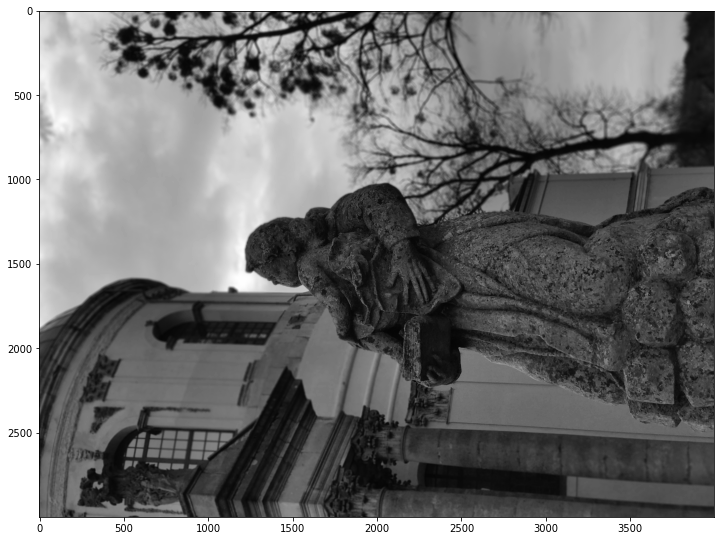

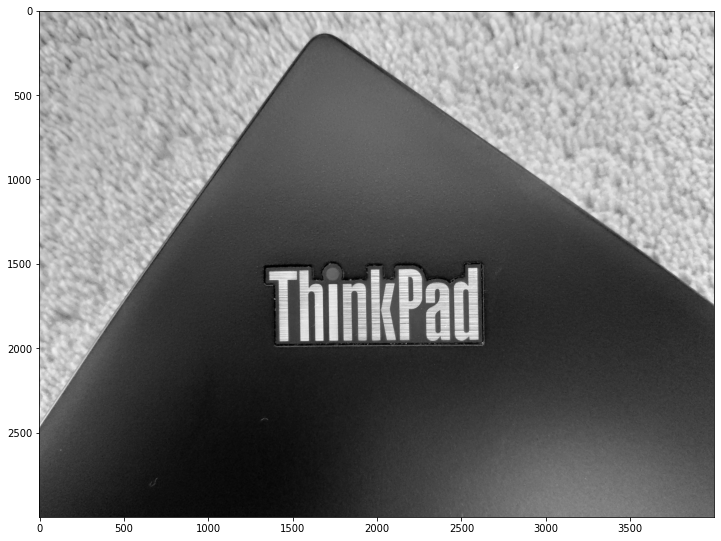

In [73]:
first = np.array(ImageOps.grayscale(Image.open("tank.jpg")))
second = np.array(ImageOps.grayscale(Image.open("church.jpg")))
third = np.array(ImageOps.grayscale(Image.open("thinkpad.jpg")))

show_img(first)
show_img(second)
show_img(third)

In [66]:
kernel_Sobel_x = np.array([
[-1, 0, 1],
[-2, 0, 2],
[-1, 0, 1]])

kernel_Sobel_y = np.array([
[1, 2, 1],
[0, 0, 0],
[-1, -2, -1]])

In [67]:
print(f'First image shape - {first.shape}')
print(f'Second image shape - {second.shape}')
print(f'Second image shape - {third.shape}')

First image shape - (3000, 4000)
Second image shape - (3000, 4000)
Second image shape - (3000, 4000)


In [61]:
def convolve(image, kernel):

    imageH, imageW = image.shape
    kernelH, kernelW = kernel.shape

    padding = kernel.shape[0] - 1
    h, w = imageH - 2 * kernelH + 2 * padding, imageW - 2 * kernelW + 2 * padding
    padded_img = np.zeros((image.shape[0] + padding*2, image.shape[1] + padding*2))
    padded_img[int(padding):int(-1 * padding), int(padding):int(-1 * padding)] = image
    
    output = np.zeros((h, w))
    for i in range(h):
        for j in range(w):
            output[i, j] = np.sum(image[i:i+kernelH, j:j+kernelW] * kernel)
    show_img(output)

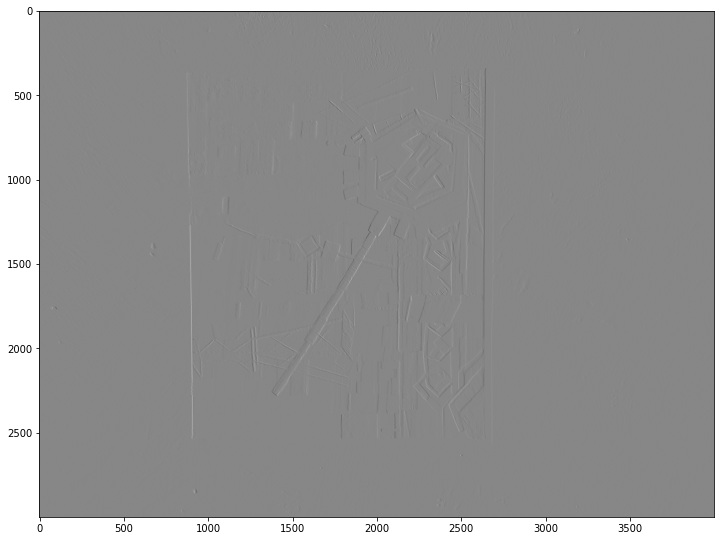

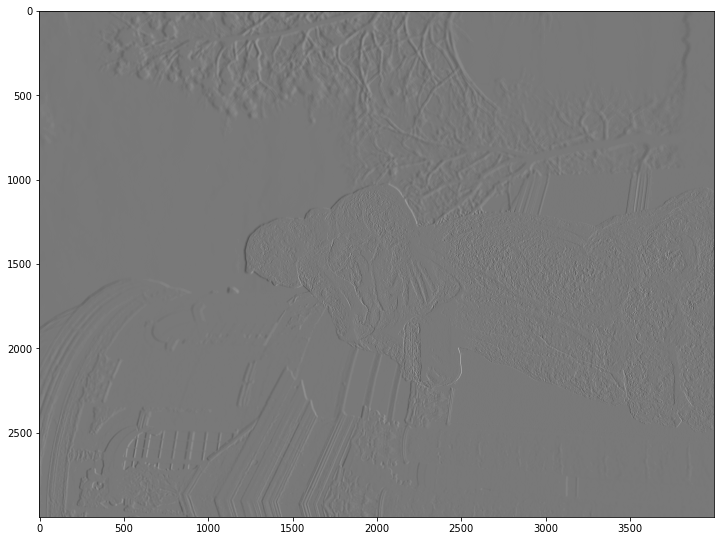

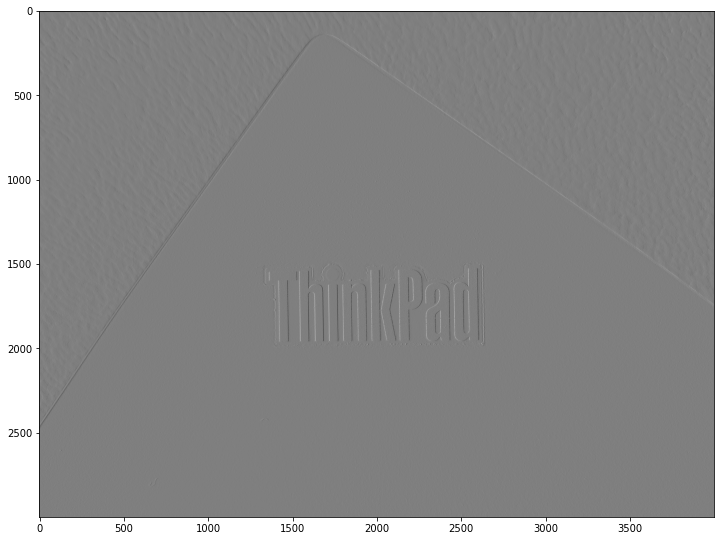

In [68]:
convolve(first, kernel_Sobel_x)
convolve(second, kernel_Sobel_x) 
convolve(third, kernel_Sobel_x) 

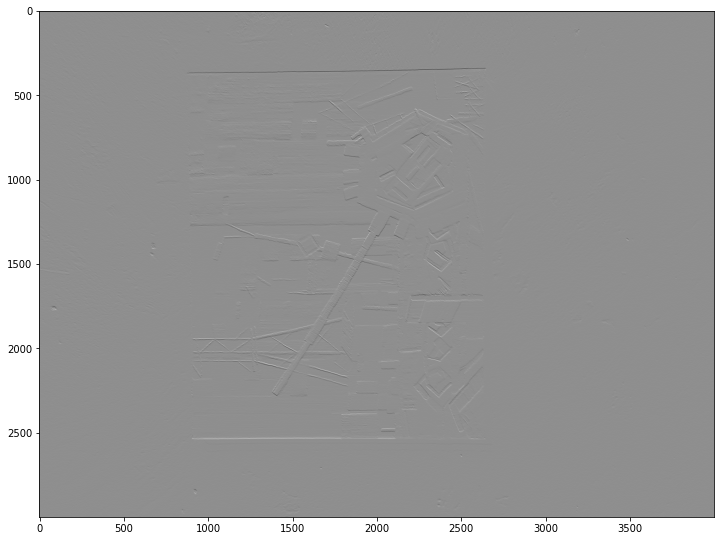

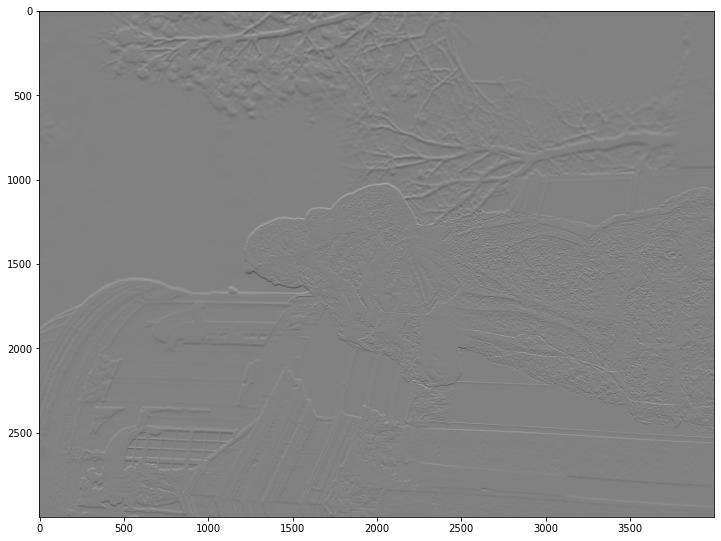

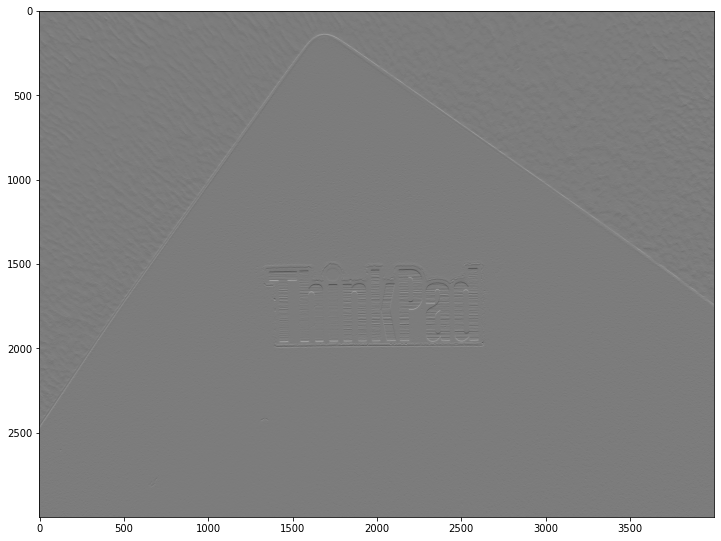

In [69]:
convolve(first, kernel_Sobel_y)
convolve(second, kernel_Sobel_y) 
convolve(third, kernel_Sobel_y) 

In [70]:
kernel_Robert_x = np.array([
[1, 0],
[0, -1]])

kernel_Robert_y = np.array([
[0, 1],
[-1, 0]])

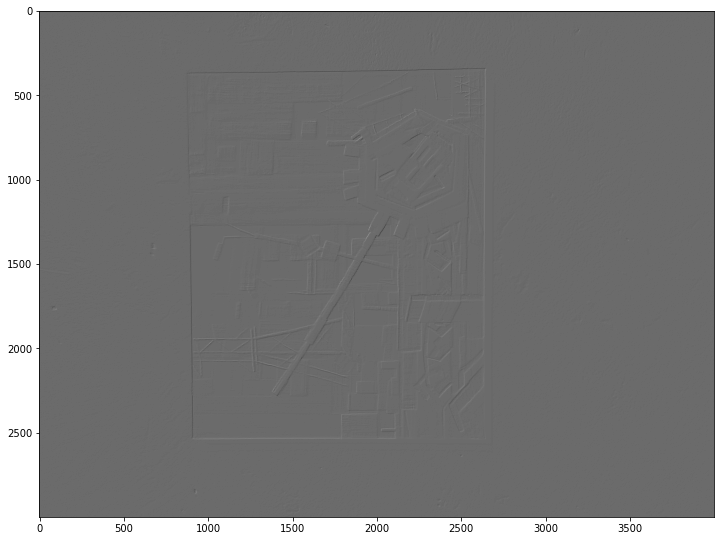

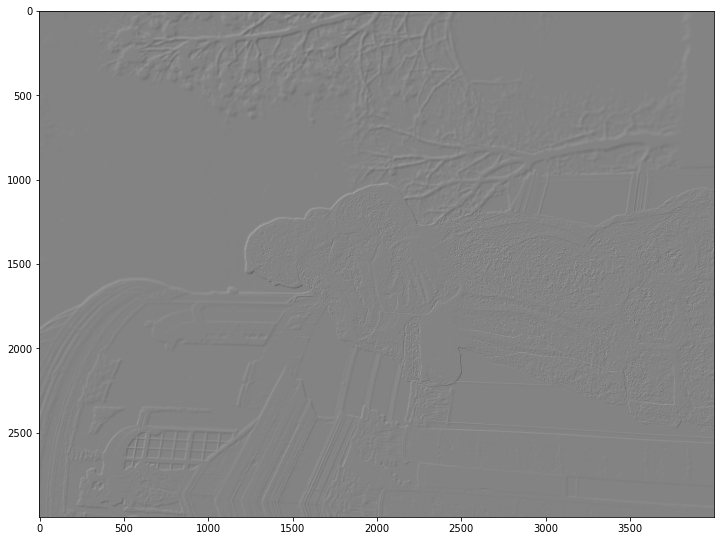

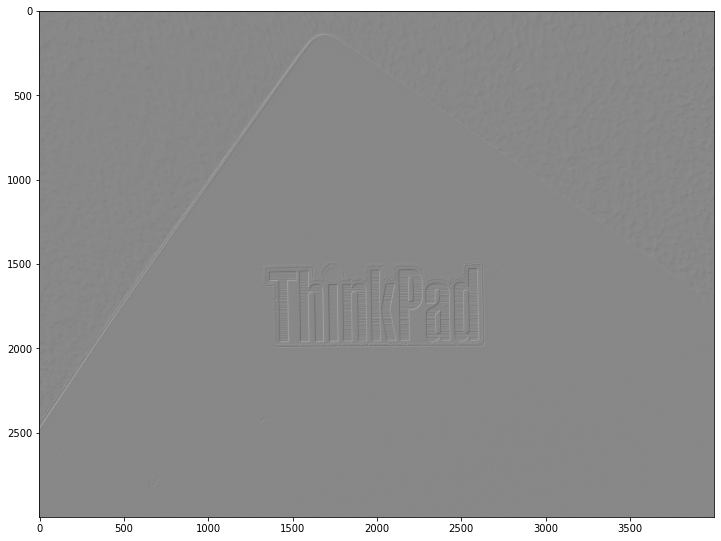

In [71]:
convolve(first, kernel_Robert_x)
convolve(second, kernel_Robert_x)
convolve(third, kernel_Robert_x)

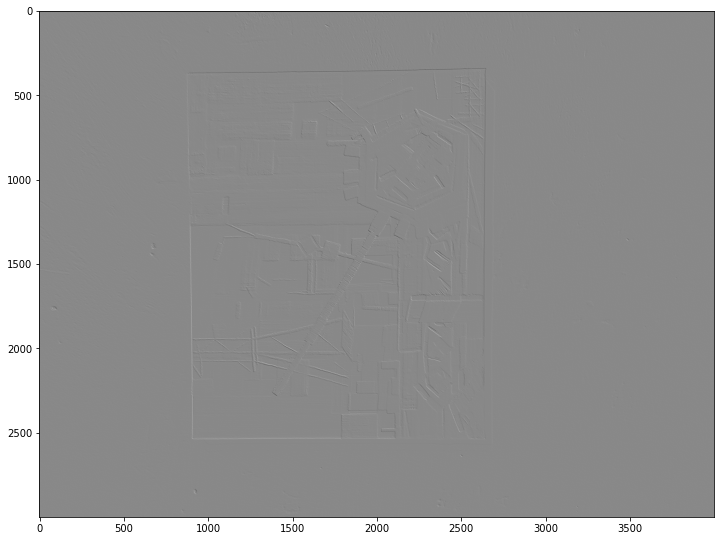

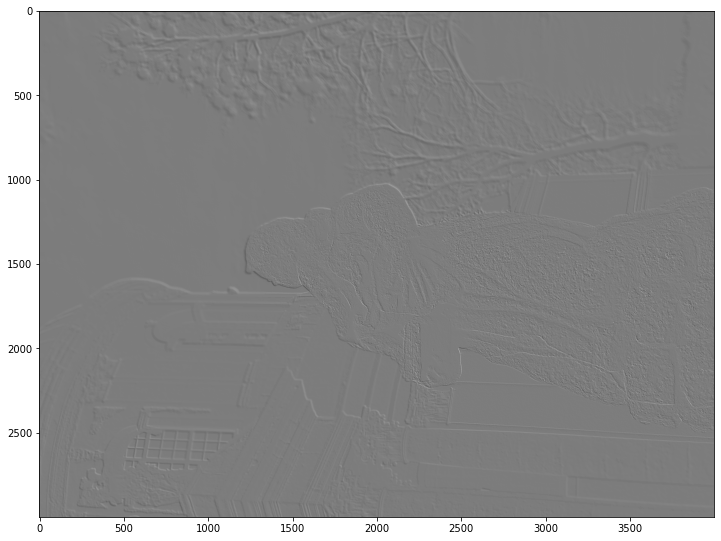

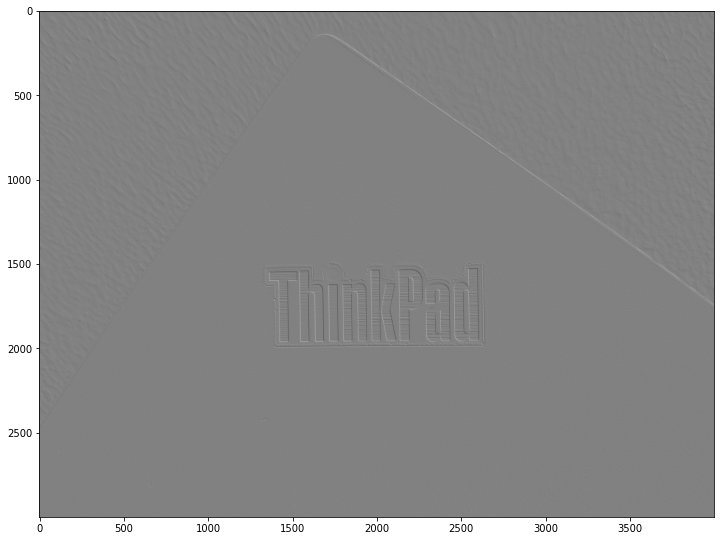

In [72]:
convolve(first, kernel_Robert_y)
convolve(second, kernel_Robert_y)
convolve(third, kernel_Robert_y)